In [1]:
pip install torch torchvision pytorch-grad-cam scikit-learn matplotlib


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


DEPRECATION: Loading egg at c:\program files\python312\lib\site-packages\vboxapi-1.0-py3.12.egg is deprecated. pip 25.1 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
ERROR: Could not find a version that satisfies the requirement pytorch-grad-cam (from versions: none)

[notice] A new release of pip is available: 25.0.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip
ERROR: No matching distribution found for pytorch-grad-cam


In [2]:
import os, time, copy, random, math
from pathlib import Path
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models

from sklearn.metrics import (accuracy_score, f1_score, precision_score,
                             recall_score, roc_auc_score, confusion_matrix,
                             classification_report)

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image


In [3]:
# =========================
# STEP 1: Config & Repro
# =========================
DATA_ROOT = r"C:/Users/HP/Downloads/Code/Skin_Dataset"      # <- your path
TRAIN_DIR = os.path.join(DATA_ROOT, "train_set")
VAL_DIR   = os.path.join(DATA_ROOT, "val_set")
TEST_DIR  = os.path.join(DATA_ROOT, "test_set")

OUT_DIR = "runs_isic"                 # logs + checkpoints
CKPT_BEST = os.path.join(OUT_DIR, "resnet50_isic_best.pth")
GRADCAM_DIR = os.path.join(OUT_DIR, "gradcam")

os.makedirs(OUT_DIR, exist_ok=True)
os.makedirs(GRADCAM_DIR, exist_ok=True)

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cpu


In [4]:
# =========================
# STEP 2: Transforms & Data
# =========================
# Light, safe augmentations for dermoscopy
train_tfms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomResizedCrop(224, scale=(0.85, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.1),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.05, hue=0.02),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])
eval_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])

train_ds = datasets.ImageFolder(TRAIN_DIR, transform=train_tfms)
val_ds   = datasets.ImageFolder(VAL_DIR,   transform=eval_tfms)
test_ds  = datasets.ImageFolder(TEST_DIR,  transform=eval_tfms)

class_names = train_ds.classes
class_to_idx = train_ds.class_to_idx
print("Classes:", class_names, "Mapping:", class_to_idx)
# Make sure you know which index is malignant:
malignant_idx = class_to_idx.get("malignant", 1)

BATCH_SIZE = 16
NUM_WORKERS = 0  # keep 0 on Windows/notebook to avoid spawn issues

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=NUM_WORKERS, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)


Classes: ['benign', 'malignant'] Mapping: {'benign': 0, 'malignant': 1}


In [5]:
# =========================
# STEP 3: Class Weights (imbalance)
# =========================
targets = torch.tensor(train_ds.targets)
counts = torch.bincount(targets, minlength=len(class_names)).float()
weights = (counts.sum() / (counts + 1e-6))  # inverse frequency
weights = (weights / weights.sum()) * len(class_names)
class_weights = weights.to(device)
print("Train counts:", counts.tolist(), "Class weights:", class_weights.tolist())


Train counts: [5200.0, 4000.0] Class weights: [0.8695652484893799, 1.1304348707199097]


In [6]:
# =========================
# STEP 4: Model
# =========================
weights_enum = models.ResNet50_Weights.IMAGENET1K_V2
model = models.resnet50(weights=weights_enum)
# Replace classifier
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, 2)
model = model.to(device)


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to C:\Users\HP/.cache\torch\hub\checkpoints\resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [03:50<00:00, 444kB/s]  


In [7]:
# Optional: Freeze backbone for few warmup epochs (then unfreeze)
FREEZE_BACKBONE_EPOCHS = 0
if FREEZE_BACKBONE_EPOCHS > 0:
    for name, p in model.named_parameters():
        if not name.startswith("fc."):
            p.requires_grad = False

In [9]:
# =========================
# STEP 5: Loss/Opt/Sched
# =========================
from torch.optim.lr_scheduler import ReduceLROnPlateau

criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)

# Fix: call from lr_scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=2, verbose=True)

# AMP scaler for mixed precision (only useful on GPU)
scaler = torch.cuda.amp.GradScaler(enabled=(device.type == "cuda"))


C:\Users\HP\AppData\Roaming\Python\Python312\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
C:\Users\HP\AppData\Local\Temp\ipykernel_21012\800871773.py:13: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device.type == "cuda"))


In [10]:
# =========================
# STEP 6: Train / Validate
# =========================
def run_epoch(model, loader, train_mode=True):
    if train_mode:
        model.train()
    else:
        model.eval()

    all_logits, all_labels = [], []
    running_loss = 0.0

    for imgs, labels in loader:
        imgs = imgs.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with torch.set_grad_enabled(train_mode):
            with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
                logits = model(imgs)
                loss = criterion(logits, labels)

            if train_mode:
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()

        running_loss += loss.item() * imgs.size(0)
        all_logits.append(logits.detach().cpu())
        all_labels.append(labels.detach().cpu())

    epoch_loss = running_loss / len(loader.dataset)
    logits = torch.cat(all_logits, dim=0)
    labels = torch.cat(all_labels, dim=0)

    probs = torch.softmax(logits, dim=1).numpy()
    preds = probs.argmax(axis=1)
    y_true = labels.numpy()
    y_score = probs[:, malignant_idx]  # probability of malignant

    acc  = accuracy_score(y_true, preds)
    f1   = f1_score(y_true, preds, average="macro")
    prec = precision_score(y_true, preds, average="macro", zero_division=0)
    rec  = recall_score(y_true, preds, average="macro")
    try:
        auc = roc_auc_score(y_true, y_score)
    except Exception:
        auc = float('nan')

    return epoch_loss, acc, f1, prec, rec, auc

EPOCHS = 10
best_val_auc = -1.0
history = []

for epoch in range(1, EPOCHS+1):
    if epoch == FREEZE_BACKBONE_EPOCHS + 1 and FREEZE_BACKBONE_EPOCHS > 0:
        # unfreeze everything
        for p in model.parameters():
            p.requires_grad = True
        print("Backbone unfrozen.")

    t0 = time.time()
    train_loss, train_acc, train_f1, train_prec, train_rec, train_auc = run_epoch(model, train_loader, train_mode=True)
    val_loss, val_acc, val_f1, val_prec, val_rec, val_auc = run_epoch(model, val_loader, train_mode=False)

    scheduler.step(val_auc if not math.isnan(val_auc) else val_acc)

    history.append({
        "epoch": epoch,
        "train_loss": train_loss, "train_acc": train_acc, "train_f1": train_f1,
        "train_prec": train_prec, "train_rec": train_rec, "train_auc": train_auc,
        "val_loss": val_loss, "val_acc": val_acc, "val_f1": val_f1,
        "val_prec": val_prec, "val_rec": val_rec, "val_auc": val_auc
    })

    print(f"[{epoch:02d}/{EPOCHS}] "
          f"train_loss={train_loss:.4f} acc={train_acc:.3f} auc={train_auc:.3f} | "
          f"val_loss={val_loss:.4f} acc={val_acc:.3f} auc={val_auc:.3f} | "
          f"time={(time.time()-t0):.1f}s")

    # Save best by AUC (fallback to acc)
    score = (val_auc if not math.isnan(val_auc) else val_acc)
    if score > best_val_auc:
        best_val_auc = score
        torch.save(model.state_dict(), CKPT_BEST)
        print("  ↳ Saved BEST checkpoint:", CKPT_BEST)


C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


[01/10] train_loss=0.2603 acc=0.904 auc=0.955 | val_loss=0.1890 acc=0.929 auc=0.988 | time=4513.6s
  ↳ Saved BEST checkpoint: runs_isic\resnet50_isic_best.pth


C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


[02/10] train_loss=0.2097 acc=0.920 auc=0.969 | val_loss=0.3930 acc=0.801 auc=0.963 | time=4888.6s


C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


[03/10] train_loss=0.1814 acc=0.933 auc=0.976 | val_loss=0.2461 acc=0.895 auc=0.980 | time=4055.3s


C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


[04/10] train_loss=0.1611 acc=0.938 auc=0.982 | val_loss=0.1245 acc=0.959 auc=0.992 | time=31894.1s
  ↳ Saved BEST checkpoint: runs_isic\resnet50_isic_best.pth


C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


[05/10] train_loss=0.1502 acc=0.942 auc=0.984 | val_loss=0.3345 acc=0.854 auc=0.949 | time=4866.1s


C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


[06/10] train_loss=0.1324 acc=0.949 auc=0.987 | val_loss=0.1393 acc=0.947 auc=0.989 | time=3886.5s


C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


[07/10] train_loss=0.1231 acc=0.951 auc=0.989 | val_loss=0.2342 acc=0.913 auc=0.979 | time=4426.5s


C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


[08/10] train_loss=0.0864 acc=0.966 auc=0.995 | val_loss=0.3198 acc=0.883 auc=0.972 | time=4522.4s


C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


[09/10] train_loss=0.0701 acc=0.975 auc=0.997 | val_loss=0.3789 acc=0.875 auc=0.966 | time=25304.6s


C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
C:\Users\HP\AppData\Local\Temp\ipykernel_21012\2269445498.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


[10/10] train_loss=0.0618 acc=0.978 auc=0.997 | val_loss=0.2123 acc=0.928 auc=0.986 | time=3722.7s


C:\Users\HP\AppData\Local\Temp\ipykernel_21012\3190547116.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(CKPT_BEST, map_location=device


=== TEST METRICS ===
Accuracy: 0.8064 | F1: 0.8026 | Precision: 0.8313 | Recall: 0.8064 | AUC: 0.9376

Classification Report:
               precision    recall  f1-score   support

      benign       0.74      0.94      0.83       550
   malignant       0.92      0.67      0.78       550

    accuracy                           0.81      1100
   macro avg       0.83      0.81      0.80      1100
weighted avg       0.83      0.81      0.80      1100



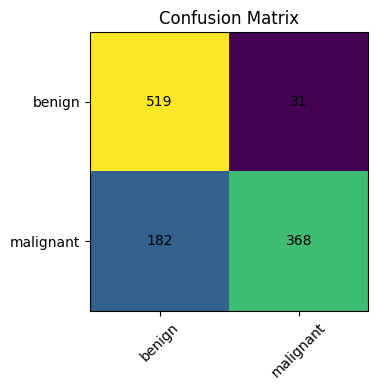

In [11]:
# =========================
# STEP 7: Load Best & Test
# =========================
model.load_state_dict(torch.load(CKPT_BEST, map_location=device))
model.eval()

# Collect test predictions
all_logits, all_labels, test_paths = [], [], []
with torch.no_grad():
    for i, (imgs, labels) in enumerate(test_loader):
        imgs = imgs.to(device)
        logits = model(imgs)
        all_logits.append(logits.cpu())
        all_labels.append(labels.cpu())
        # stash file paths (ImageFolder stores them in .samples)
        batch_paths = [test_ds.samples[i*BATCH_SIZE + j][0] for j in range(imgs.size(0))]
        test_paths.extend(batch_paths)

logits = torch.cat(all_logits, dim=0)
labels = torch.cat(all_labels, dim=0).numpy()
probs = torch.softmax(logits, dim=1).numpy()
preds = probs.argmax(axis=1)
y_score = probs[:, malignant_idx]

acc  = accuracy_score(labels, preds)
f1   = f1_score(labels, preds, average="macro")
prec = precision_score(labels, preds, average="macro", zero_division=0)
rec  = recall_score(labels, preds, average="macro")
try:
    auc = roc_auc_score(labels, y_score)
except Exception:
    auc = float('nan')

print("\n=== TEST METRICS ===")
print(f"Accuracy: {acc:.4f} | F1: {f1:.4f} | Precision: {prec:.4f} | Recall: {rec:.4f} | AUC: {auc:.4f}")
print("\nClassification Report:\n", classification_report(labels, preds, target_names=class_names))

# Confusion Matrix (optional quick plot)
cm = confusion_matrix(labels, preds)
fig = plt.figure(figsize=(4,4))
plt.imshow(cm, interpolation='nearest')
plt.title("Confusion Matrix")
plt.xticks(range(2), class_names, rotation=45)
plt.yticks(range(2), class_names)
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, cm[i,j], ha="center", va="center")
plt.tight_layout(); plt.show()


#### Grad-CAM XAI

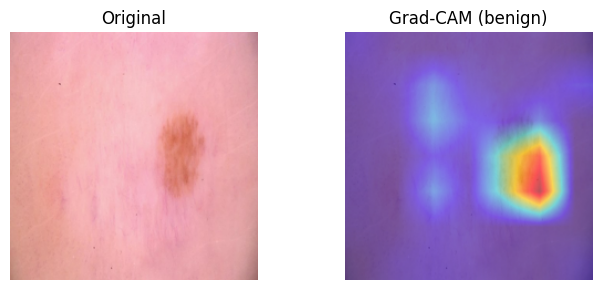

Saved: runs_isic\gradcam\benign\ISIC_0191734_640x360_true-benign_pred-benign.png and runs_isic\gradcam\benign\ISIC_0191734_640x360_panel.png


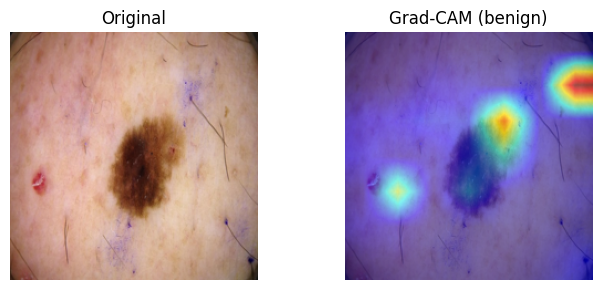

Saved: runs_isic\gradcam\benign\ISIC_0192893_640x478_true-benign_pred-benign.png and runs_isic\gradcam\benign\ISIC_0192893_640x478_panel.png


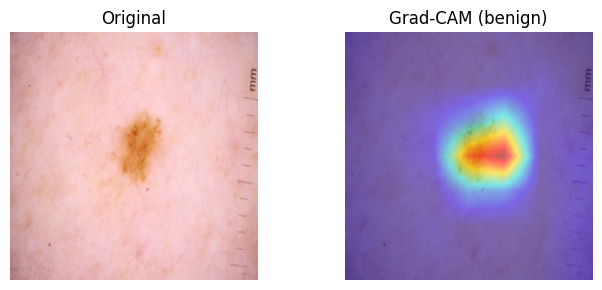

Saved: runs_isic\gradcam\benign\ISIC_0193785_640x427_true-benign_pred-benign.png and runs_isic\gradcam\benign\ISIC_0193785_640x427_panel.png


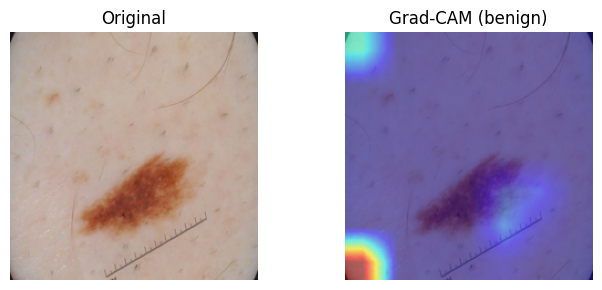

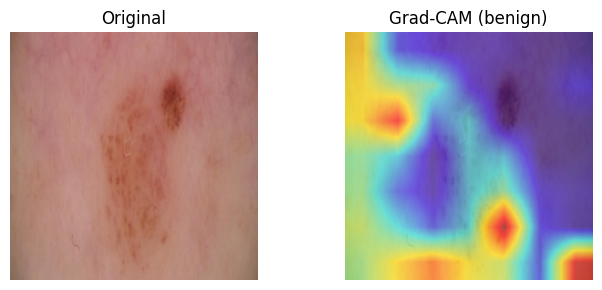

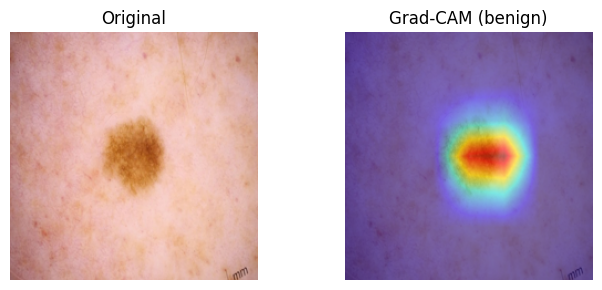


✅ Grad-CAM overlays saved in: runs_isic\gradcam
   Per-class folders: benign, malignant


In [13]:
# =========================
# STEP 8: Grad-CAM (plot first, then save)
# =========================
def load_rgb_224(path):
    img = Image.open(path).convert("RGB").resize((224,224))
    arr = np.asarray(img).astype(np.float32) / 255.0
    return img, arr  # PIL, float np

target_layers = [model.layer4[-1]]

# Create per-class folders
for cname in class_names:
    os.makedirs(os.path.join(GRADCAM_DIR, cname), exist_ok=True)

SHOW_N = 6
cam = GradCAM(model=model, target_layers=target_layers)

for idx in range(len(test_ds)):
    img_path, label = test_ds.samples[idx]

    pil_raw = Image.open(img_path).convert("RGB")
    pil_224 = pil_raw.resize((224,224))
    x = eval_tfms(pil_raw).unsqueeze(0).to(device)

    grayscale_cam = cam(input_tensor=x)[0, :]  # [H,W]
    _, rgb_img = load_rgb_224(img_path)
    cam_overlay = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    # PLOT FIRST
    if idx < SHOW_N:
        plt.figure(figsize=(7,3))
        plt.subplot(1,2,1); plt.imshow(pil_224); plt.title("Original"); plt.axis("off")
        plt.subplot(1,2,2); plt.imshow(cam_overlay); plt.title(f"Grad-CAM ({class_names[label]})"); plt.axis("off")
        plt.tight_layout(); plt.show()

    # SAVE RESULTS
    pred_cls = int(torch.softmax(model(x), dim=1).argmax(dim=1).item())
    fname = f"{Path(img_path).stem}_true-{class_names[label]}_pred-{class_names[pred_cls]}.png"
    save_dir = os.path.join(GRADCAM_DIR, class_names[label])
    out_path_overlay = os.path.join(save_dir, fname)

    Image.fromarray(cam_overlay).save(out_path_overlay)

    fig = plt.figure(figsize=(7,3))
    plt.subplot(1,2,1); plt.imshow(pil_224); plt.axis("off"); plt.title("Original")
    plt.subplot(1,2,2); plt.imshow(cam_overlay); plt.axis("off"); plt.title("Grad-CAM")
    plt.tight_layout()
    panel_path = os.path.join(save_dir, f"{Path(img_path).stem}_panel.png")
    fig.savefig(panel_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

    if idx < 3:
        print("Saved:", out_path_overlay, "and", panel_path)

print(f"\n✅ Grad-CAM overlays saved in: {GRADCAM_DIR}\n"
      f"   Per-class folders: {', '.join(class_names)}")


#### Saliency Maps (XAI)

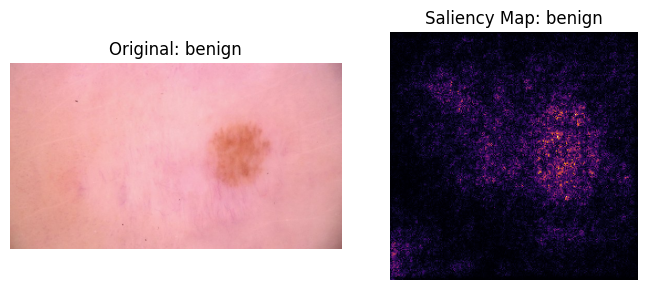

Saved: results_saliency\benign\ISIC_0191734_640x360_true-benign_pred-benign.png and results_saliency\benign\ISIC_0191734_640x360_panel.png


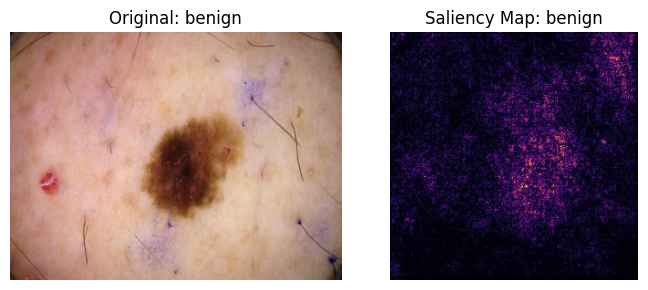

Saved: results_saliency\benign\ISIC_0192893_640x478_true-benign_pred-benign.png and results_saliency\benign\ISIC_0192893_640x478_panel.png


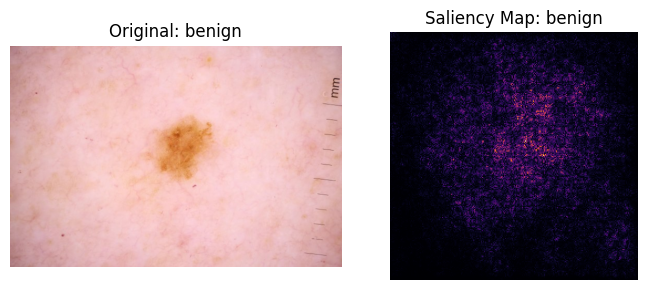

Saved: results_saliency\benign\ISIC_0193785_640x427_true-benign_pred-benign.png and results_saliency\benign\ISIC_0193785_640x427_panel.png


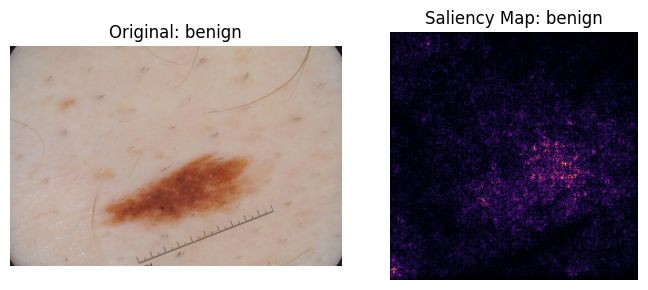

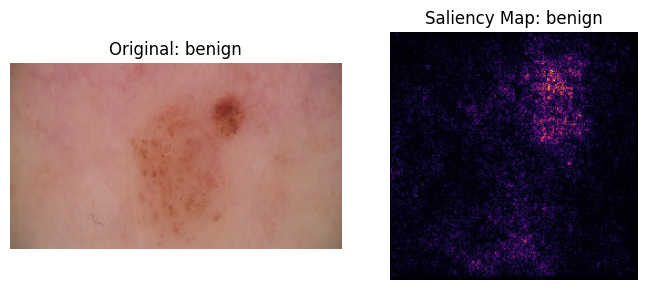

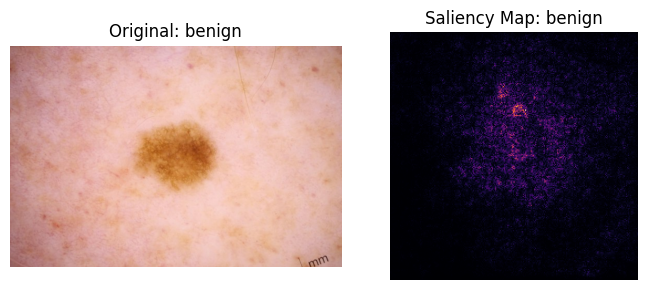


✅ Saliency Maps saved in: results_saliency
   Per-class folders: benign, malignant


In [15]:
# =========================
# STEP 9: Saliency Maps (XAI)
# =========================

SALIENCY_DIR = "results_saliency"
os.makedirs(SALIENCY_DIR, exist_ok=True)


def compute_saliency(model, image_tensor, target_class=None):
    """
    Compute saliency map for a single input image.
    """
    image_tensor = image_tensor.clone().detach().unsqueeze(0).to(device).requires_grad_(True)

    model.zero_grad()
    output = model(image_tensor)

    if target_class is None:
        target_class = output.argmax(dim=1).item()

    score = output[0, target_class]
    score.backward()

    saliency, _ = torch.max(image_tensor.grad.data.abs(), dim=1)
    saliency = saliency.squeeze().cpu().numpy()

    # Normalize to [0,1]
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8)
    return saliency


# Create per-class folders
for cname in class_names:
    os.makedirs(os.path.join(SALIENCY_DIR, cname), exist_ok=True)

SHOW_N = 6  # number of examples to plot inline

for idx in range(len(test_ds)):
    img_path, label = test_ds.samples[idx]
    pil_raw = Image.open(img_path).convert("RGB")

    # Preprocess same as eval
    x = eval_tfms(pil_raw).unsqueeze(0).to(device)

    # Compute saliency map
    saliency = compute_saliency(model, x.squeeze(0), target_class=label)

    # Convert saliency map to heatmap
    saliency_img = plt.cm.inferno(saliency)[..., :3]  # apply colormap

    # PLOT inline (first N samples only)
    if idx < SHOW_N:
        plt.figure(figsize=(7,3))
        plt.subplot(1,2,1)
        plt.imshow(pil_raw)
        plt.title(f"Original: {class_names[label]}")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(saliency_img)
        plt.title(f"Saliency Map: {class_names[label]}")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

    # SAVE results
    pred_cls = int(torch.softmax(model(x), dim=1).argmax(dim=1).item())
    fname = f"{Path(img_path).stem}_true-{class_names[label]}_pred-{class_names[pred_cls]}.png"
    save_dir = os.path.join(SALIENCY_DIR, class_names[label])

    # Save only saliency heatmap
    saliency_out_path = os.path.join(save_dir, fname)
    Image.fromarray((saliency_img*255).astype(np.uint8)).save(saliency_out_path)

    # Save side-by-side panel (Original + Saliency)
    fig = plt.figure(figsize=(7,3))
    plt.subplot(1,2,1); plt.imshow(pil_raw); plt.axis("off"); plt.title(f"Original: {class_names[label]}")
    plt.subplot(1,2,2); plt.imshow(saliency_img); plt.axis("off"); plt.title(f"Saliency Map: {class_names[label]}")
    plt.tight_layout()
    panel_path = os.path.join(save_dir, f"{Path(img_path).stem}_panel.png")
    fig.savefig(panel_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

    if idx < 3:
        print("Saved:", saliency_out_path, "and", panel_path)

print(f"\n✅ Saliency Maps saved in: {SALIENCY_DIR}\n"
      f"   Per-class folders: {', '.join(class_names)}")


#### Combined Grad-Cam & Saliency Map:

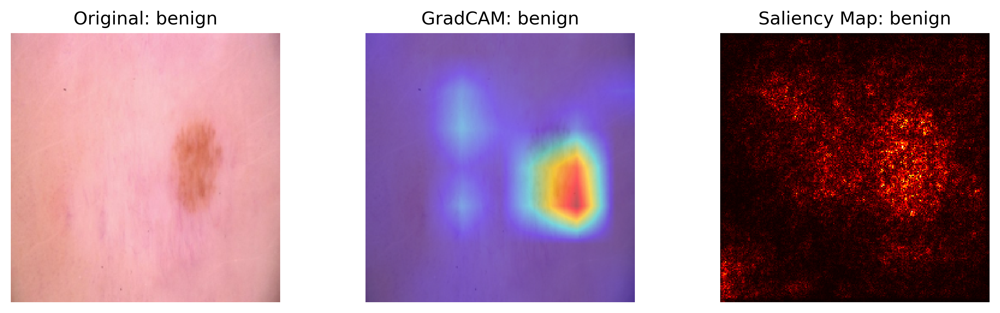

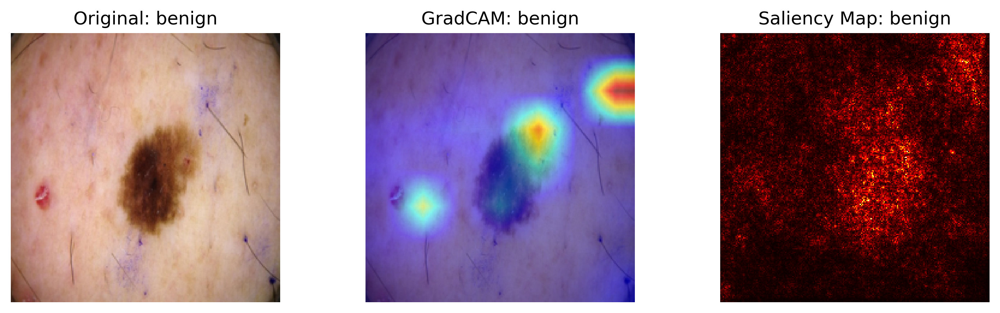

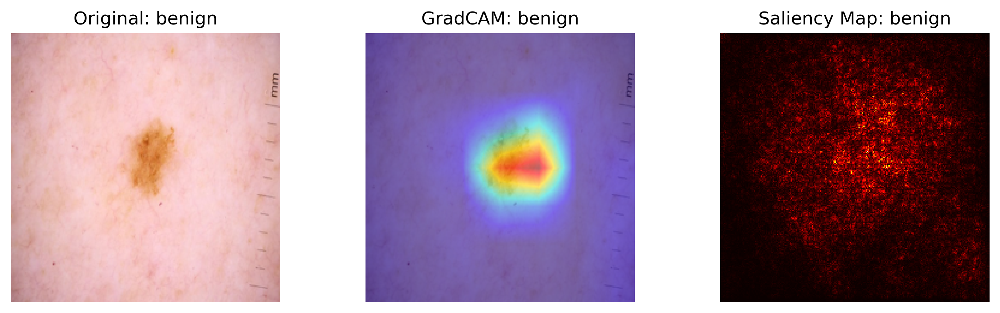

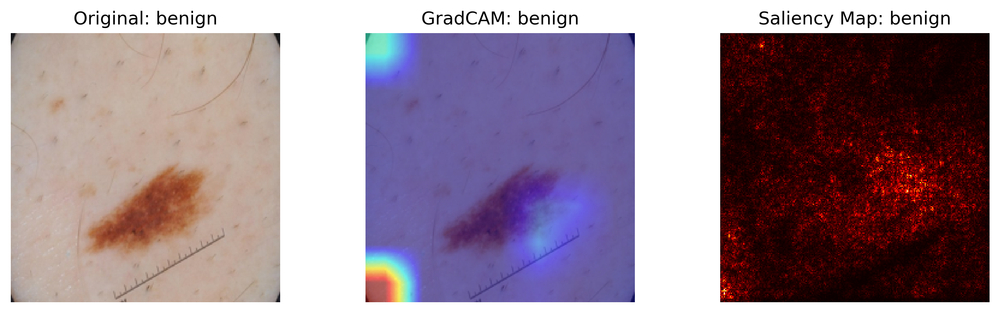

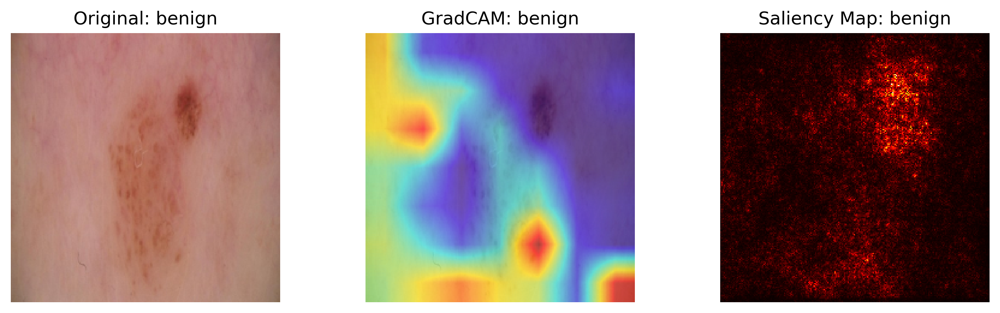

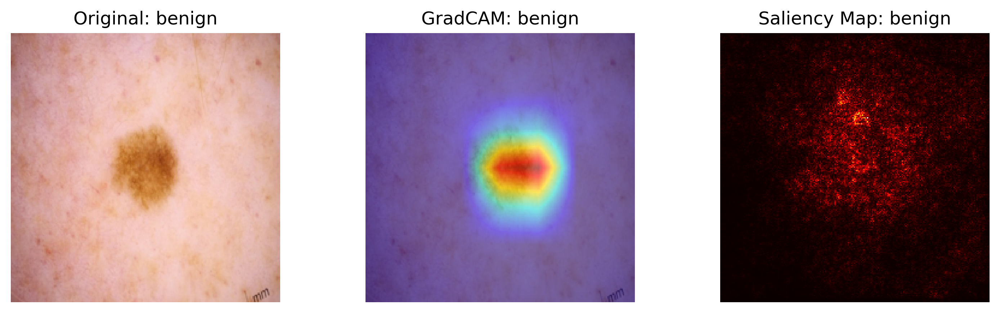


✅ Combined XAI panels saved in: results_xai_combined


In [18]:
# =========================
# STEP 10: Combined Grad-CAM + Saliency Maps (fixed cleanup, no device arg)
# =========================
COMBINED_DIR = "results_xai_combined"
os.makedirs(COMBINED_DIR, exist_ok=True)

SHOW_N = 6  # number of examples to show inline
target_layers = [model.layer4[-1]]

def compute_saliency(model, image_tensor, target_class=None):
    image_tensor.requires_grad_()
    outputs = model(image_tensor)
    if target_class is None:
        target_class = outputs.argmax(dim=1).item()
    score = outputs[0, target_class]
    score.backward()

    saliency, _ = torch.max(image_tensor.grad.data.abs(), dim=1)
    return saliency[0].cpu().numpy()

# --- Initialize GradCAM explicitly (no device argument)
cam = GradCAM(model=model, target_layers=target_layers)

for idx in range(len(test_ds)):
    img_path, label = test_ds.samples[idx]

    # --- Original
    pil_raw = Image.open(img_path).convert("RGB")
    pil_224 = pil_raw.resize((224, 224))
    x = eval_tfms(pil_raw).unsqueeze(0).to(device)

    # --- Grad-CAM
    grayscale_cam = cam(input_tensor=x)[0, :]
    _, rgb_img = load_rgb_224(img_path)
    cam_overlay = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    # --- Saliency
    saliency_map = compute_saliency(model, x.clone())
    saliency_norm = (saliency_map - saliency_map.min()) / (saliency_map.max() - saliency_map.min() + 1e-8)

    # --- Prediction
    pred_cls = int(torch.softmax(model(x), dim=1).argmax(dim=1).item())
    fname = f"{Path(img_path).stem}_true-{class_names[label]}_pred-{class_names[pred_cls]}.png"

    # --- Panel (3 columns)
    fig = plt.figure(figsize=(10, 3))
    plt.subplot(1, 3, 1); plt.imshow(pil_224); plt.axis("off"); plt.title(f"Original: {class_names[label]}")
    plt.subplot(1, 3, 2); plt.imshow(cam_overlay); plt.axis("off"); plt.title(f"GradCAM: {class_names[label]}")
    plt.subplot(1, 3, 3); plt.imshow(saliency_norm, cmap="hot"); plt.axis("off"); plt.title(f"Saliency Map: {class_names[label]}")
    plt.tight_layout()

    # Save panel
    out_path = os.path.join(COMBINED_DIR, fname)
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

    if idx < SHOW_N:
        display(Image.open(out_path))

# --- Manual cleanup (prevents the warning)
cam.__del__()

print(f"\n✅ Combined XAI panels saved in: {COMBINED_DIR}")


#### Grad-Cam++

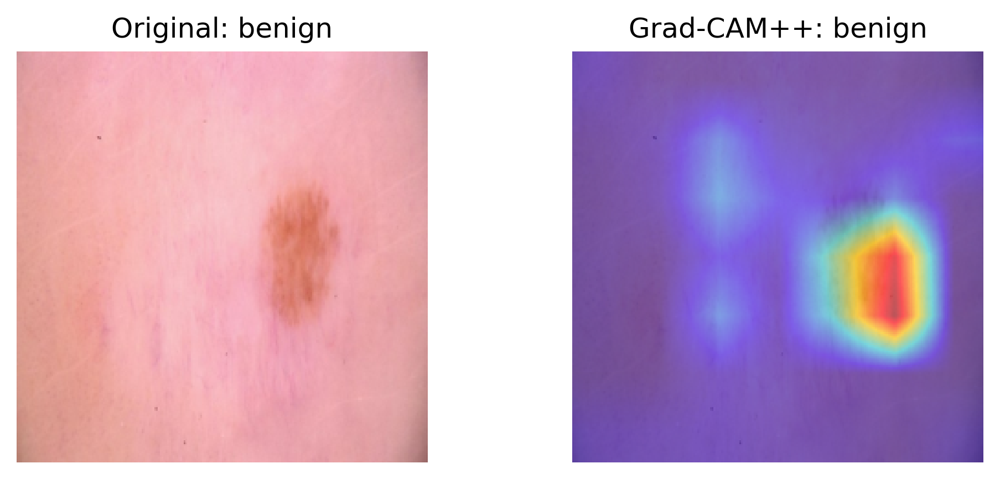

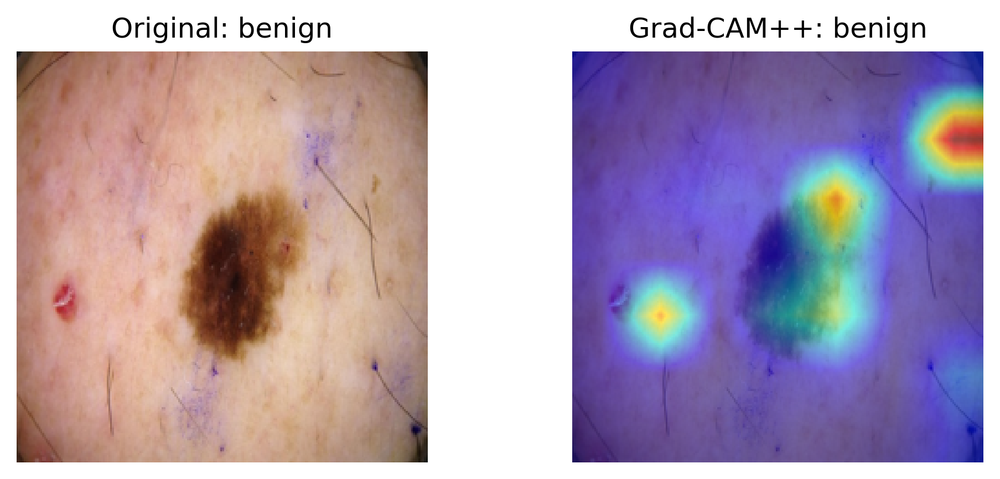

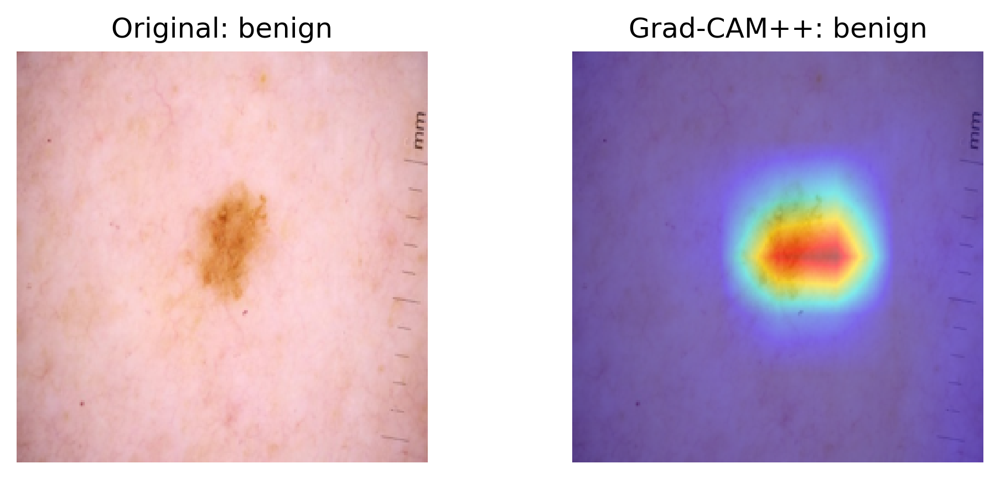

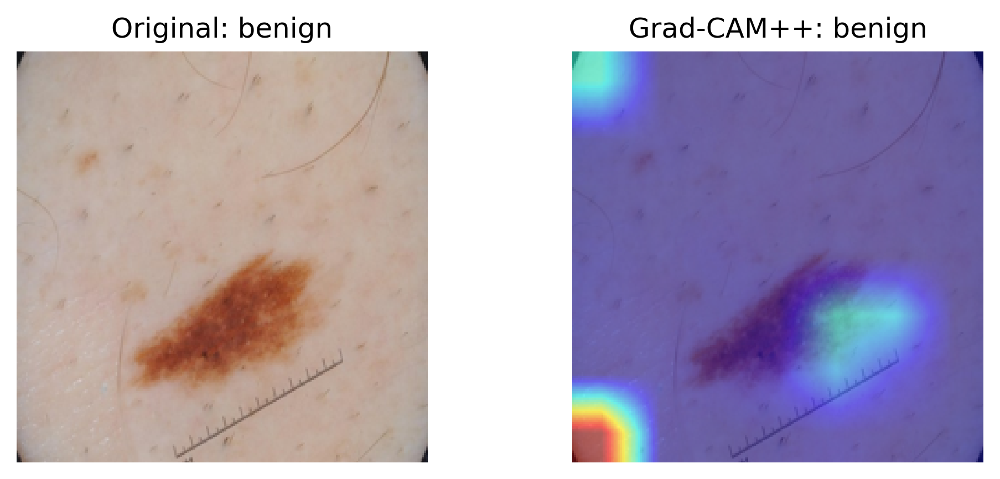

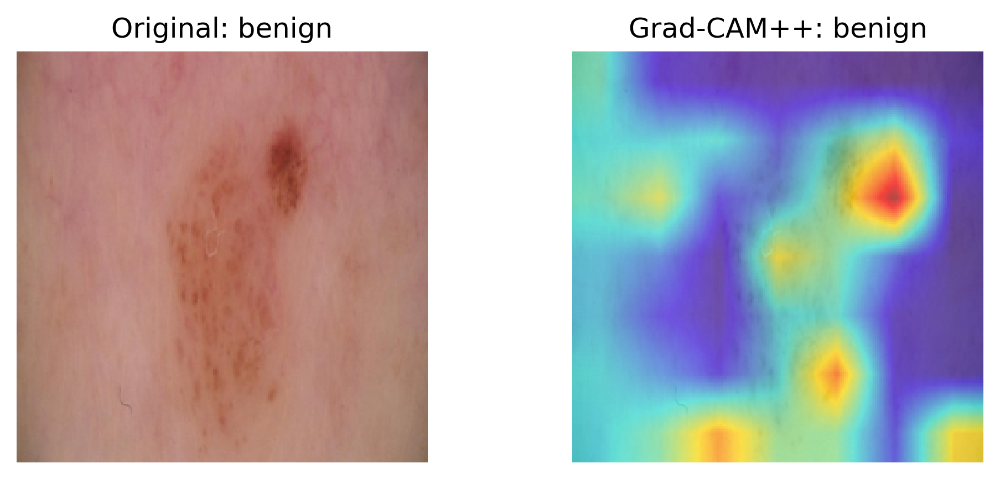

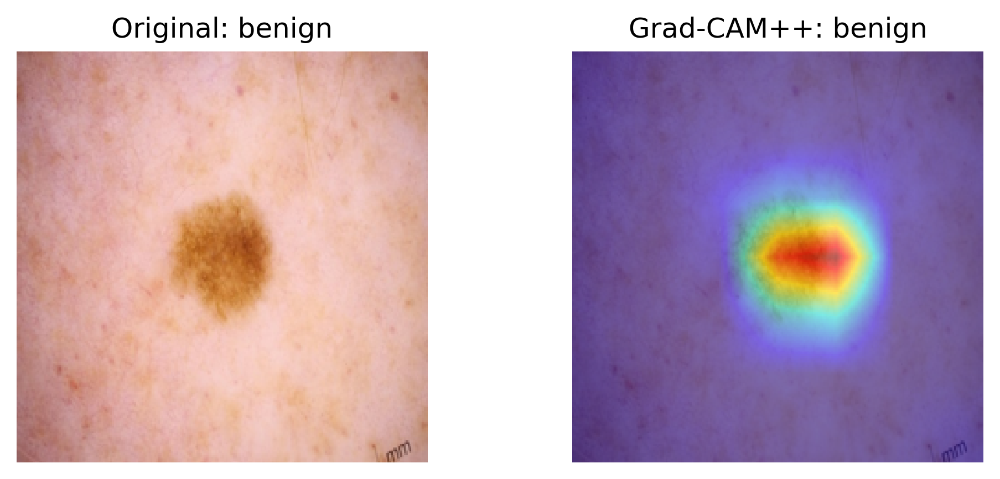

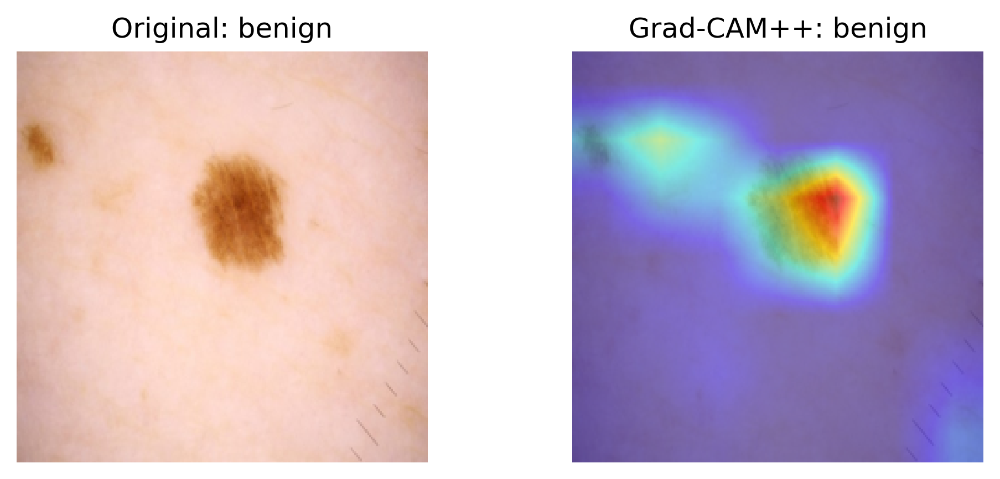


✅ Grad-CAM++ overlays saved in: rad_Cam++


In [19]:
# =========================
# STEP 11: Grad-CAM++
# =========================
from pytorch_grad_cam import GradCAMPlusPlus

GRADCAMPP_DIR = "rad_Cam++"
os.makedirs(GRADCAMPP_DIR, exist_ok=True)

SHOW_N = 7
target_layers = [model.layer4[-1]]

# --- Initialize Grad-CAM++
cam_pp = GradCAMPlusPlus(model=model, target_layers=target_layers)

for idx in range(len(test_ds)):
    img_path, label = test_ds.samples[idx]

    # Original image
    pil_raw = Image.open(img_path).convert("RGB")
    pil_224 = pil_raw.resize((224, 224))
    x = eval_tfms(pil_raw).unsqueeze(0).to(device)

    # Grad-CAM++
    grayscale_cam = cam_pp(input_tensor=x)[0, :]
    _, rgb_img = load_rgb_224(img_path)
    cam_overlay = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    # Prediction
    pred_cls = int(torch.softmax(model(x), dim=1).argmax(dim=1).item())
    fname = f"{Path(img_path).stem}_true-{class_names[label]}_pred-{class_names[pred_cls]}.png"

    # --- Plot & Save
    fig = plt.figure(figsize=(7, 3))
    plt.subplot(1, 2, 1); plt.imshow(pil_224); plt.axis("off"); plt.title(f"Original: {class_names[label]}")
    plt.subplot(1, 2, 2); plt.imshow(cam_overlay); plt.axis("off"); plt.title(f"Grad-CAM++: {class_names[label]}")
    plt.tight_layout()

    out_path = os.path.join(GRADCAMPP_DIR, fname)
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

    if idx < SHOW_N:
        display(Image.open(out_path))

# --- Clean up
cam_pp.__del__()

print(f"\n✅ Grad-CAM++ overlays saved in: {GRADCAMPP_DIR}")


#### Combine (Grad-Cam, Grad-Cam++, Saliency Map)

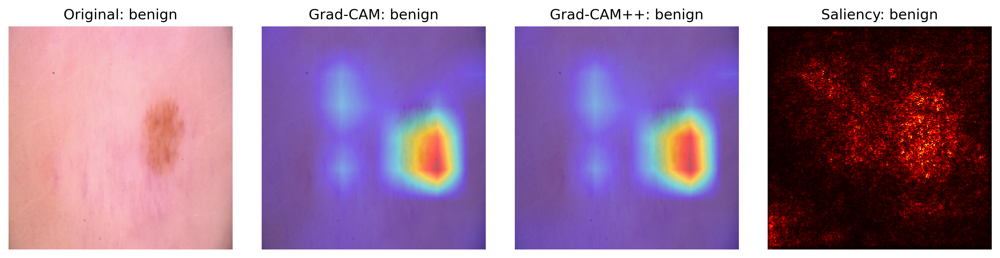

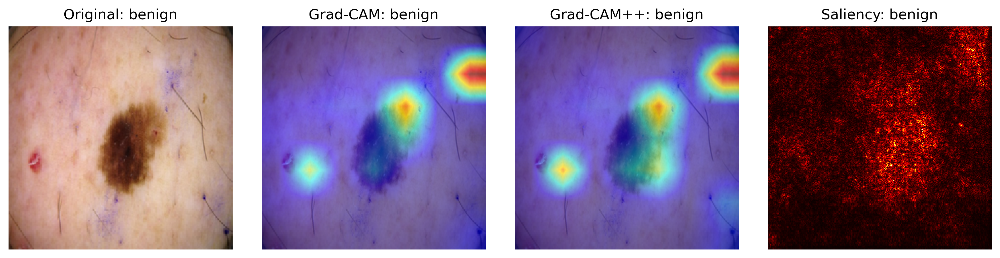

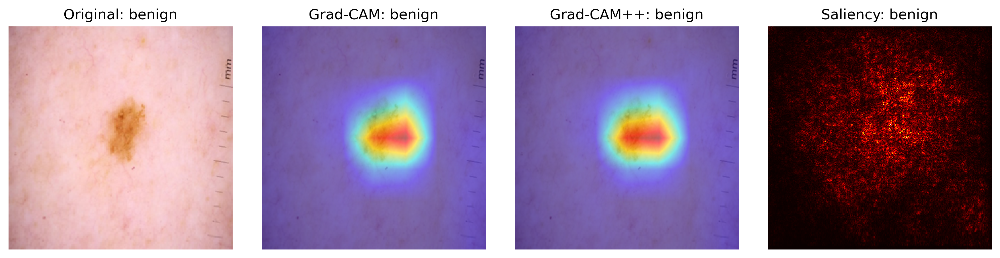

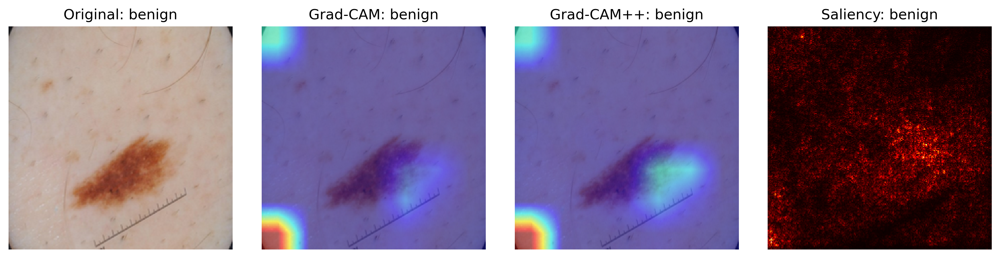

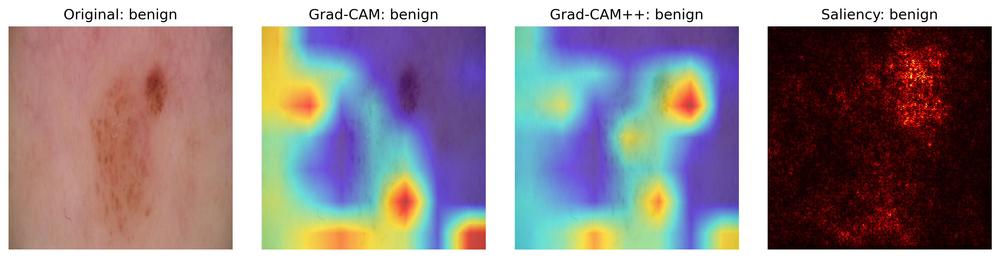

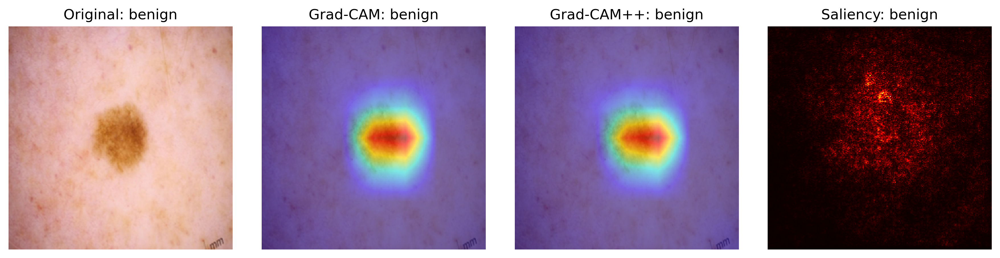


✅ Combined XAI figures saved in: results_xai_combined


In [20]:
# =========================
# STEP 12: Combined XAI Figure (Original + Grad-CAM + Grad-CAM++ + Saliency)
# =========================
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from torchvision import transforms

COMBINED_XAI_DIR = "results_xai_combined"
os.makedirs(COMBINED_XAI_DIR, exist_ok=True)

# Grad-CAM and Grad-CAM++
target_layers = [model.layer4[-1]]
cam = GradCAM(model=model, target_layers=target_layers)
cam_pp = GradCAMPlusPlus(model=model, target_layers=target_layers)

def compute_saliency(input_tensor, model):
    """Return normalized saliency map"""
    input_tensor.requires_grad_()
    logits = model(input_tensor)
    score = logits[:, logits.argmax(dim=1)]
    score.backward(torch.ones_like(score))

    saliency, _ = torch.max(input_tensor.grad.data.abs(), dim=1)
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8)
    return saliency[0].cpu().numpy()

SHOW_N = 6

for idx in range(len(test_ds)):
    img_path, label = test_ds.samples[idx]

    # Load raw + model-ready
    pil_raw = Image.open(img_path).convert("RGB")
    pil_224 = pil_raw.resize((224, 224))
    x = eval_tfms(pil_raw).unsqueeze(0).to(device)

    # --- Grad-CAM
    grayscale_cam = cam(input_tensor=x)[0, :]
    _, rgb_img = load_rgb_224(img_path)
    cam_overlay = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    # --- Grad-CAM++
    grayscale_cam_pp = cam_pp(input_tensor=x)[0, :]
    campp_overlay = show_cam_on_image(rgb_img, grayscale_cam_pp, use_rgb=True)

    # --- Saliency Map
    saliency_map = compute_saliency(x.clone(), model)

    # --- Prediction
    pred_cls = int(torch.softmax(model(x), dim=1).argmax(dim=1).item())
    true_label = class_names[label]
    pred_label = class_names[pred_cls]

    # --- Plot & Save
    fig = plt.figure(figsize=(12, 3))
    plt.subplot(1, 4, 1); plt.imshow(pil_224); plt.axis("off"); plt.title(f"Original: {true_label}")
    plt.subplot(1, 4, 2); plt.imshow(cam_overlay); plt.axis("off"); plt.title(f"Grad-CAM: {true_label}")
    plt.subplot(1, 4, 3); plt.imshow(campp_overlay); plt.axis("off"); plt.title(f"Grad-CAM++: {true_label}")
    plt.subplot(1, 4, 4); plt.imshow(saliency_map, cmap="hot"); plt.axis("off"); plt.title(f"Saliency: {true_label}")
    plt.tight_layout()

    fname = f"{Path(img_path).stem}_true-{true_label}_pred-{pred_label}.png"
    out_path = os.path.join(COMBINED_XAI_DIR, fname)
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

    if idx < SHOW_N:
        display(Image.open(out_path))

# Cleanup
cam.__del__()
cam_pp.__del__()

print(f"\n✅ Combined XAI figures saved in: {COMBINED_XAI_DIR}")
